<a href="https://colab.research.google.com/github/Boutayna-el/Cell-analysis-segmentation-and-tracking/blob/main/GANLab_To_complete2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

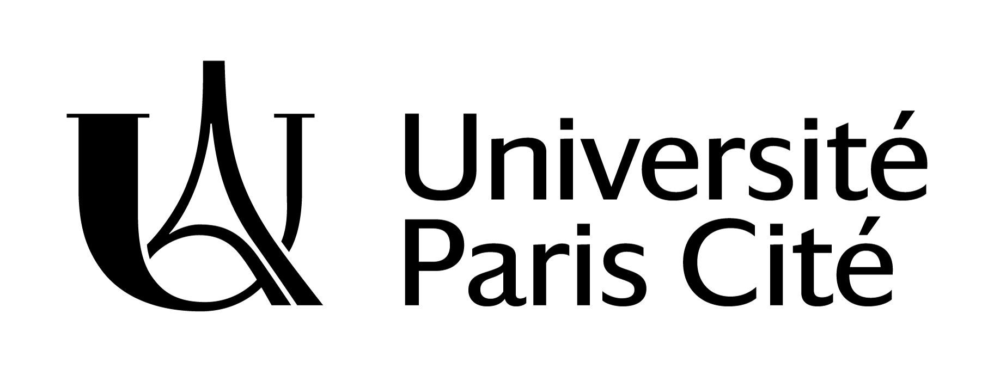



# M2 VMI - TP GenAI: Catch them all (and more)

You can choose to do this lab on either a Google Colab instance, or locally. If you do it on a Colab instance, make sure to activate the GPU.

Images: © Nintendo/Game Freak.

Exercises after d2l.ai

## 1) Loading the data
Let's get all of the data required for this lab.


In [2]:
!wget http://d2l-data.s3-accelerate.amazonaws.com/pokemon.zip
!unzip pokemon.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
 extracting: pokemon/601/601-0.png   
 extracting: pokemon/601/601-49.png  
 extracting: pokemon/601/601-55.png  
 extracting: pokemon/601/601-45.png  
 extracting: pokemon/601/601-27.png  
 extracting: pokemon/601/601-78.png  
 extracting: pokemon/601/601-41.png  
 extracting: pokemon/601/601-8.png   
 extracting: pokemon/601/601-43.png  
 extracting: pokemon/601/601-20.png  
 extracting: pokemon/601/601-58.png  
 extracting: pokemon/601/601-19.png  
 extracting: pokemon/601/601-28.png  
 extracting: pokemon/601/601-69.png  
 extracting: pokemon/601/601-75.png  
 extracting: pokemon/601/601-17.png  
 extracting: pokemon/601/601-1.png   
 extracting: pokemon/601/601-30.png  
 extracting: pokemon/601/601-26.png  
 extracting: pokemon/601/601-21.png  
 extracting: pokemon/601/601-76.png  
 extracting: pokemon/601/601-5.png   
 extracting: pokemon/601/601-62.png  
 extracting: pokemon/601/601-4.png   
 extractin

As you might have guessed, we will look at pokemons (the data is from https://pokemondb.net/sprites)

For some of them, you even have several sprites that form an animation!

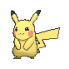

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from pathlib import PurePath

# List of image filenames
filenames = [str(PurePath('pokemon', '25', f'25-{i}.png')) for i in range(33)]

fig, ax = plt.subplots(figsize=(0.64, 0.64), dpi=100)
img = mpimg.imread(filenames[0])
im = ax.imshow(img)
ax.axis('off')

def update(frame):
    img = mpimg.imread(filenames[frame])
    im.set_array(img)
    return [im]

ani = FuncAnimation(fig, update, frames=len(filenames), interval=60, blit=True)

# Display the animation as an HTML5 video in Colab
HTML(ani.to_jshtml())

Load the dataset, and vizualize a few samples:

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 5 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


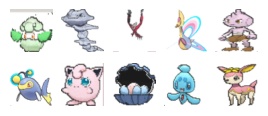

In [4]:
import warnings
import torch
import torchvision
from torch import nn

pokemon = torchvision.datasets.ImageFolder('pokemon')
batch_size = 256
transformer = torchvision.transforms.Compose([
    torchvision.transforms.Resize((64, 64)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(0.5, 0.5)
])
pokemon.transform = transformer
data_iter = torch.utils.data.DataLoader(
    pokemon, batch_size=batch_size,
    shuffle=True, num_workers=5)

warnings.filterwarnings('ignore')
num_rows = 2
num_cols = 5
fig, axes = plt.subplots(num_rows, num_cols, figsize=(0.64*num_cols, 0.64*num_rows), dpi=100)
for X, y in data_iter:
    imgs = X[:num_rows * num_cols,:,:,:].permute(0, 2, 3, 1)/2+0.5
    for img_index, img in enumerate(imgs):
      axes[img_index//num_cols, img_index%num_cols].imshow(img)
      axes[img_index//num_cols, img_index%num_cols].axis('off')
    break

Finally, let's add a few functions that will be helping us down the road.

In [5]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import time
from IPython.display import clear_output

def try_gpu():
    return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class Timer:
    def __init__(self):
        self.start_time = None
        self.total_time = 0
    def start(self):
        self.start_time = time.time()
    def stop(self):
        if self.start_time is None:
            return 0
        self.total_time += time.time() - self.start_time
        self.start_time = None
        return self.total_time

class Accumulator:
    """Accumulate sums over n variables."""
    def __init__(self, n):
        self.data = [0.0] * n
    def add(self, *args):
        self.data = [a + float(b) for a, b in zip(self.data, args)]
    def reset(self):
        self.data = [0.0] * len(self.data)
    def __getitem__(self, idx):
        return self.data[idx]

## Part 1 - VAE
### 1.1 Defining the architecture
We will create a simple architecture for our auto-encoder.

In [6]:
# Define the VAE model
class ConvVAE(nn.Module):
    def __init__(self, latent_dim=128):
        super(ConvVAE, self).__init__()
        self.latent_dim = latent_dim

        # Encoder: 3x64x64 input RGB images
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 4, 2, 1),  # 32x32x32
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1),  # 64x16x16
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1),  # 128x8x8
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, 2, 1),  # 256x4x4
            nn.ReLU(),
        )

        self.fc_mu = nn.Linear(256*4*4, latent_dim)
        self.fc_logvar = nn.Linear(256*4*4, latent_dim)

        # Decoder
        self.fc_decoder = nn.Linear(latent_dim, 256*4*4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1),  # 128x8x8
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),  # 64x16x16
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),  # 32x32x32
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 4, 2, 1),  # 3x64x64
            nn.Sigmoid(),  # Output in [0,1]
        )

    def encode(self, x):
        h = self.encoder(x)
        h = h.view(h.size(0), -1)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = self.fc_decoder(z)
        h = h.view(h.size(0), 256, 4, 4)
        return self.decoder(h)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon_x = self.decode(z)
        return recon_x, mu, logvar

### 1.2 Training loop


Finally, we can define the training loop. Here you will need to fill the parts maked as

```
## TO COMPLETE ##
```

Epoch 1, Loss: 2423.6380


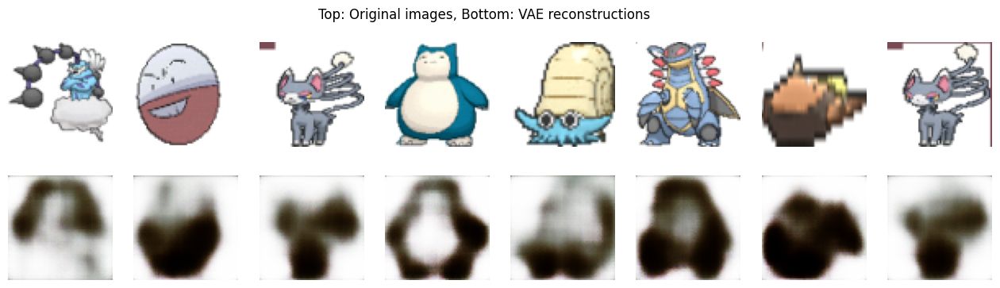

Epoch 2, Loss: 1694.9672


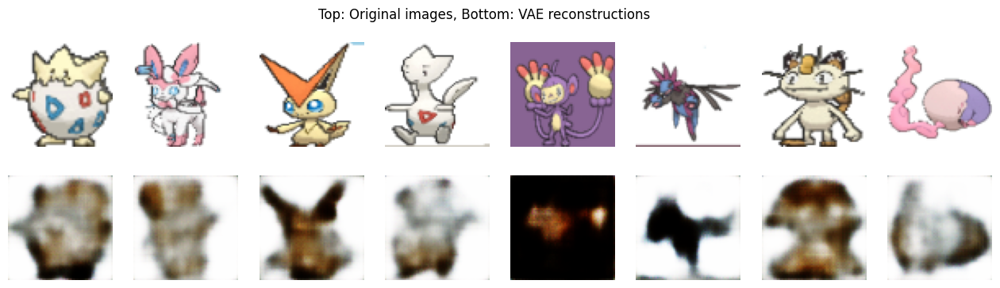

Epoch 3, Loss: 1416.0363


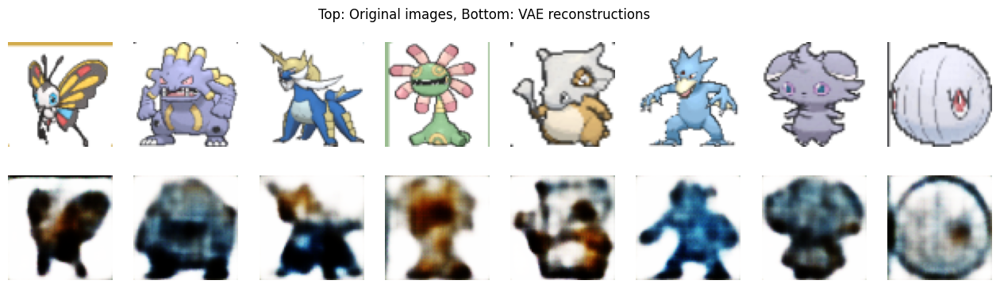

Epoch 4, Loss: 1270.0859


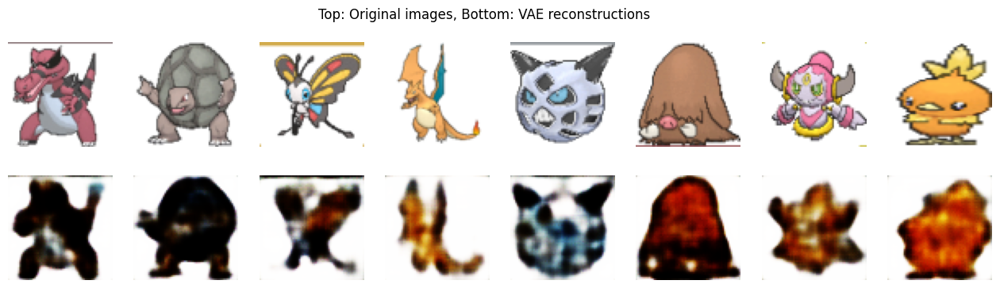

Epoch 5, Loss: 1189.1805


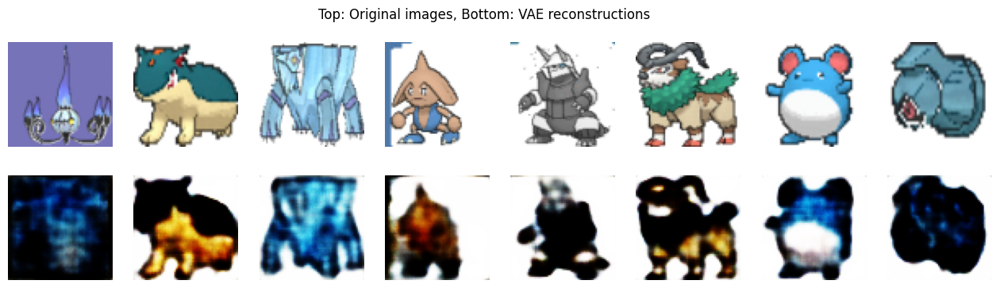

Epoch 6, Loss: 1135.9453


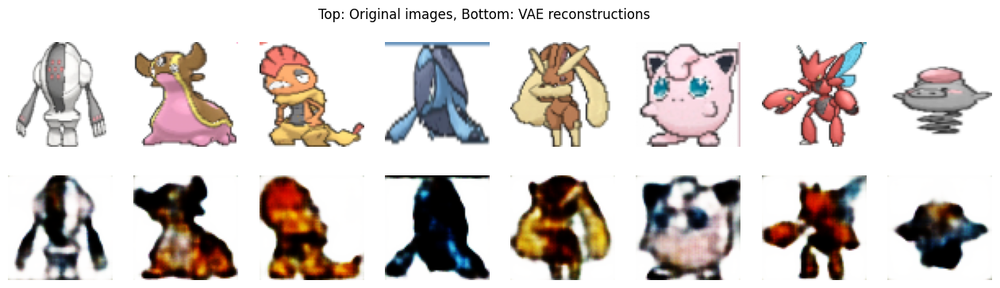

Epoch 7, Loss: 1095.3798


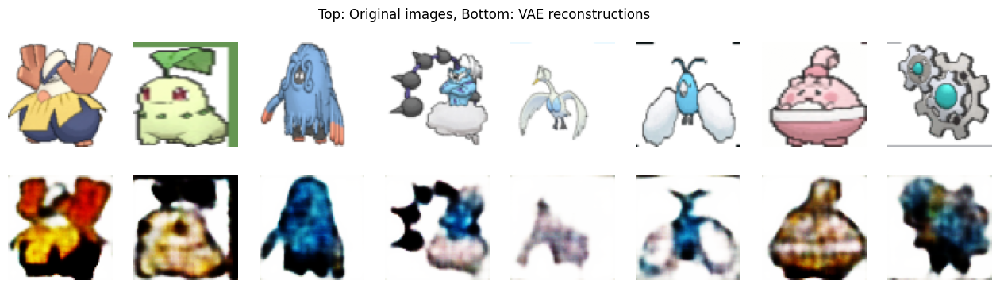

Epoch 8, Loss: 1066.9828


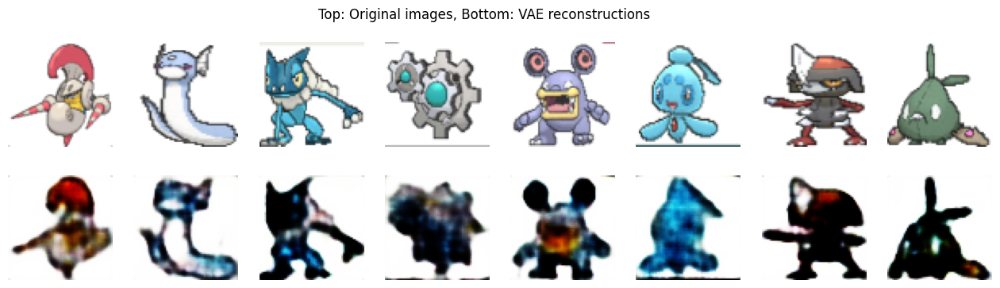

Epoch 9, Loss: 1042.5846


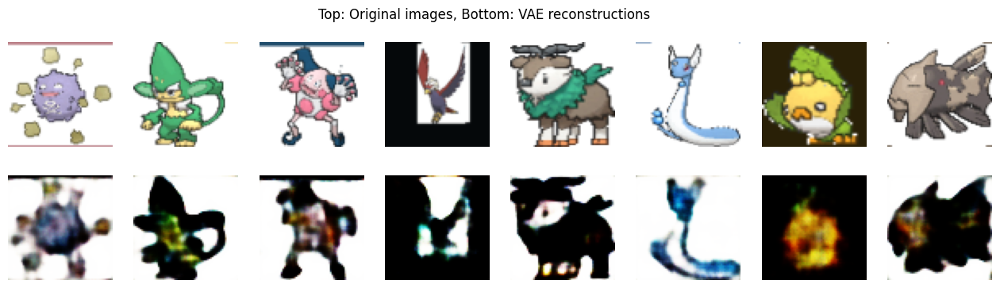

Epoch 10, Loss: 1022.3558


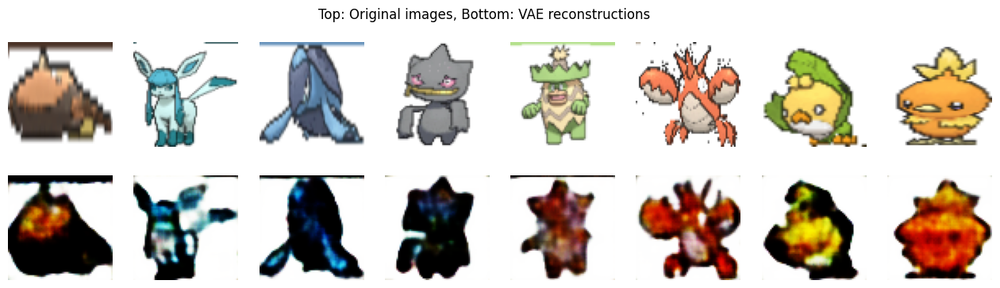

Epoch 11, Loss: 1006.6010


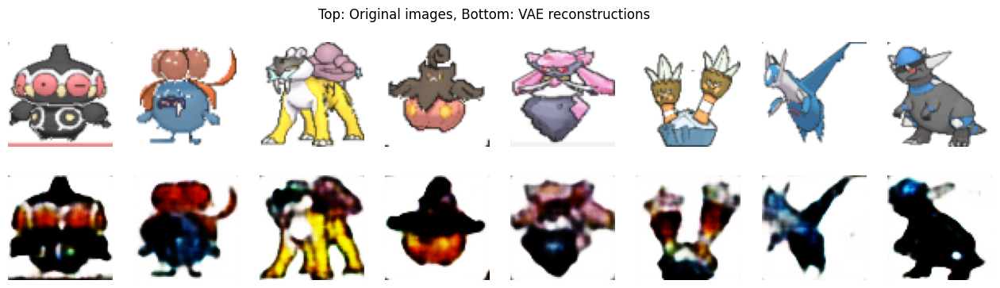

Epoch 12, Loss: 991.1058


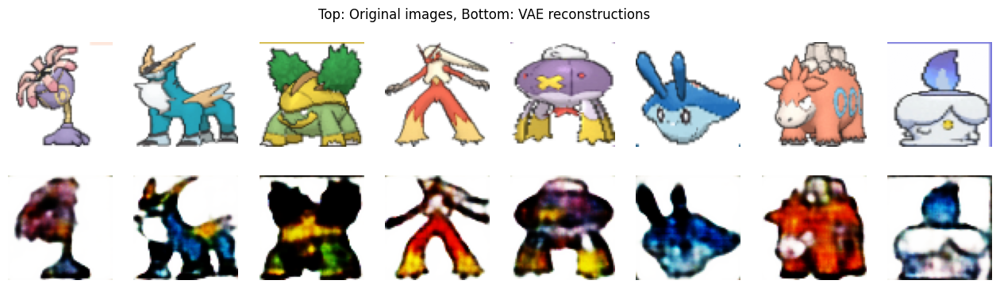

Epoch 13, Loss: 980.2777


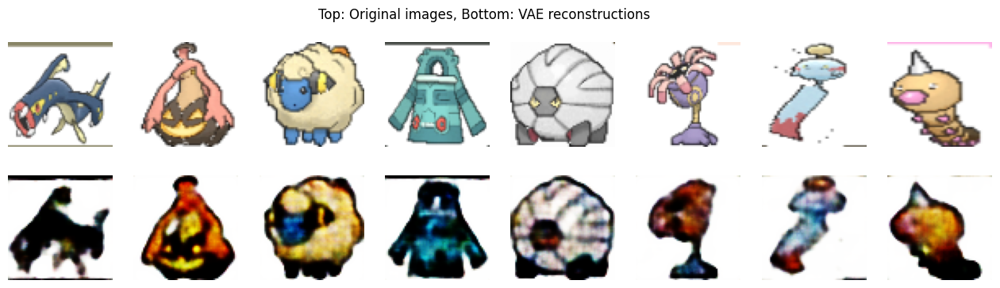

Epoch 14, Loss: 969.0093


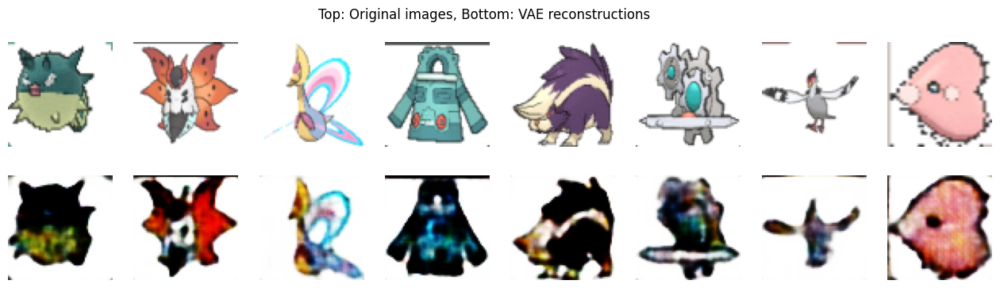

Epoch 15, Loss: 958.0129


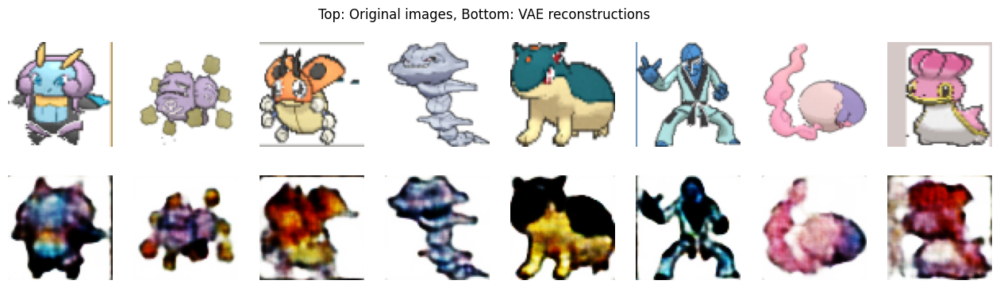

Epoch 16, Loss: 951.4092


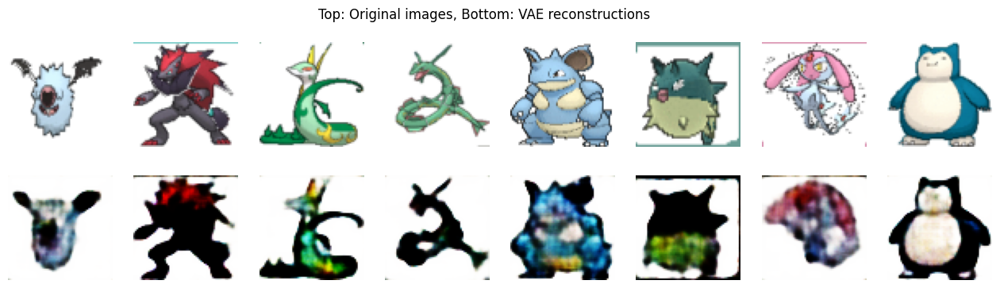

Epoch 17, Loss: 942.2329


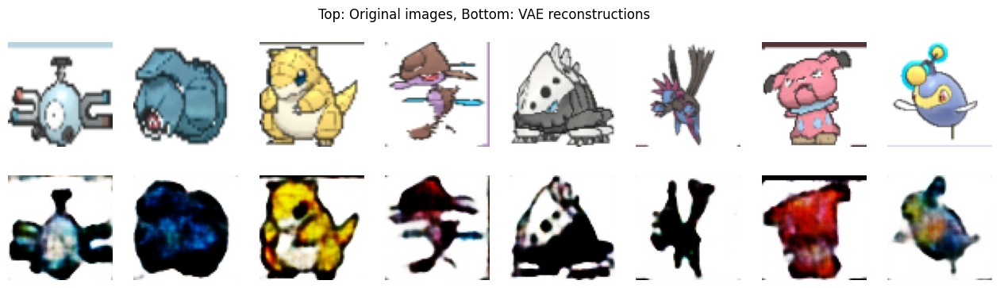

Epoch 18, Loss: 935.7010


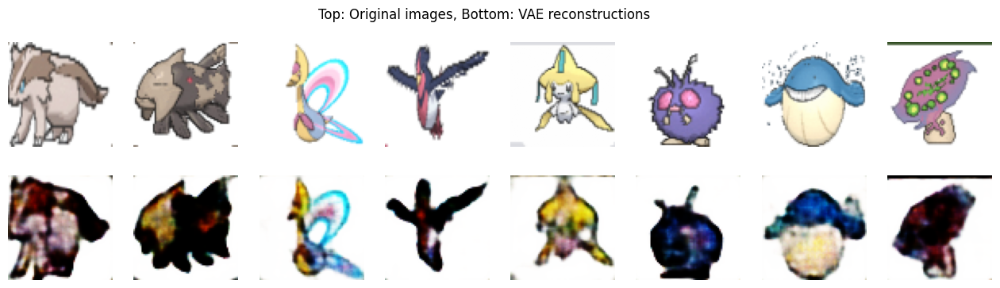

Epoch 19, Loss: 930.3318


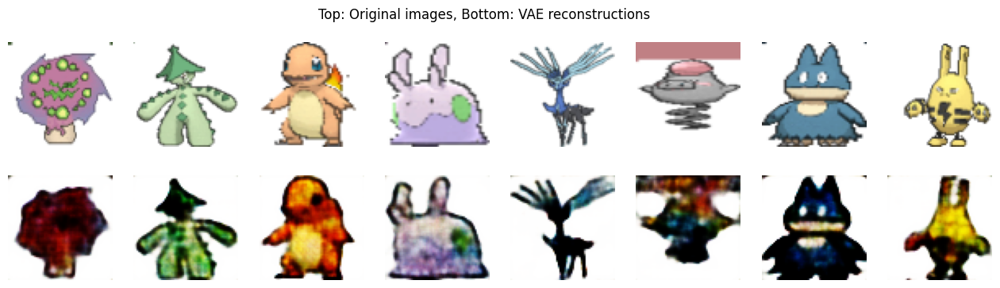

Epoch 20, Loss: 924.2207


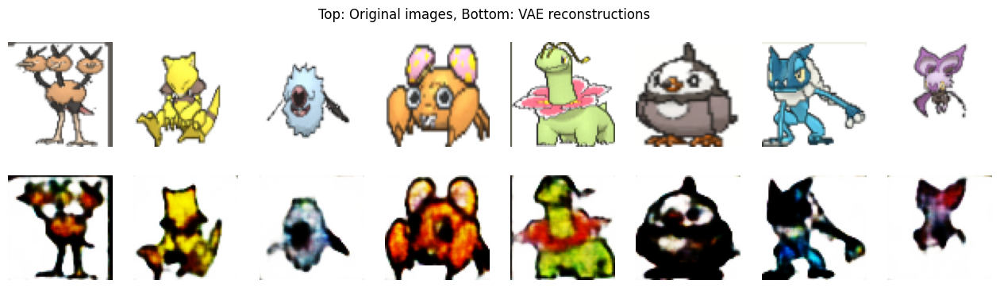

Epoch 21, Loss: 919.2206


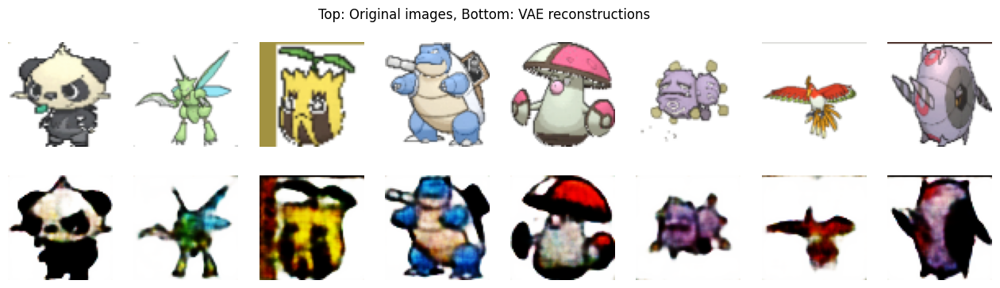

Epoch 22, Loss: 915.1963


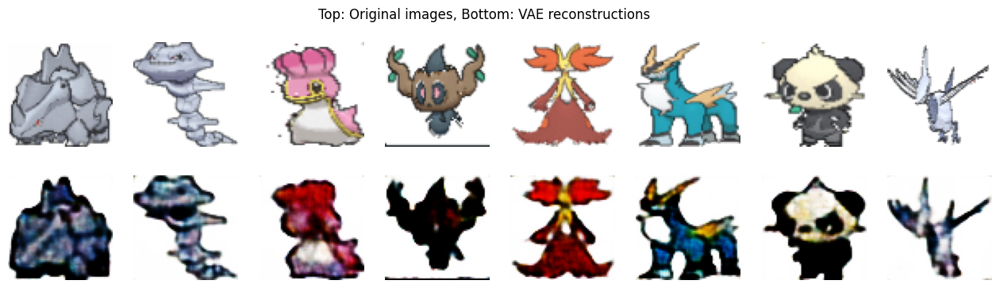

Epoch 23, Loss: 910.9741


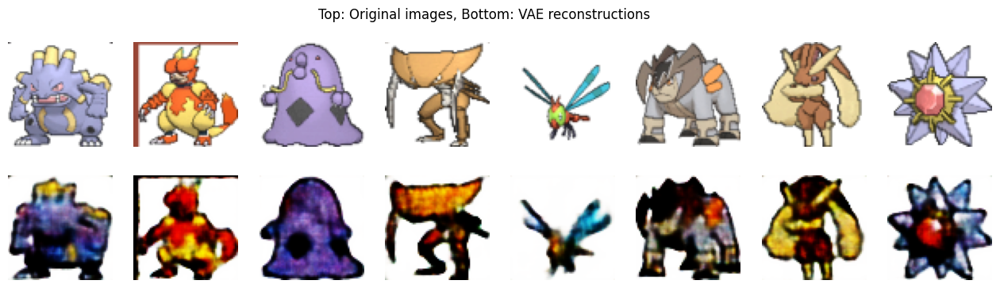

Epoch 24, Loss: 906.7083


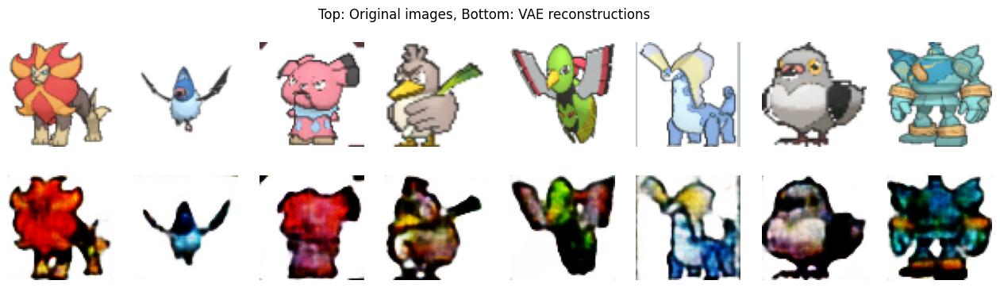

Epoch 25, Loss: 903.0791


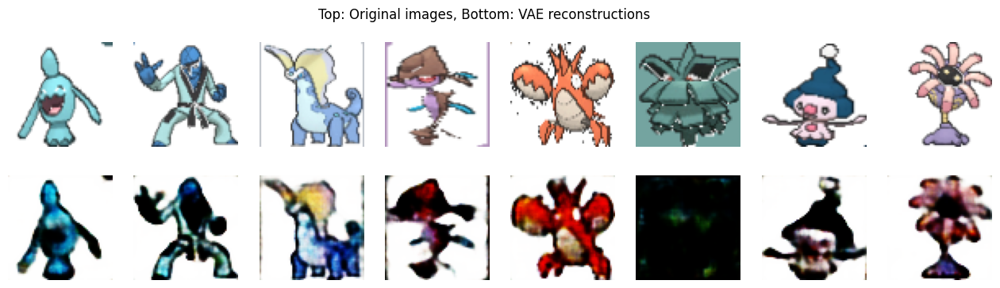

Epoch 26, Loss: 899.2644


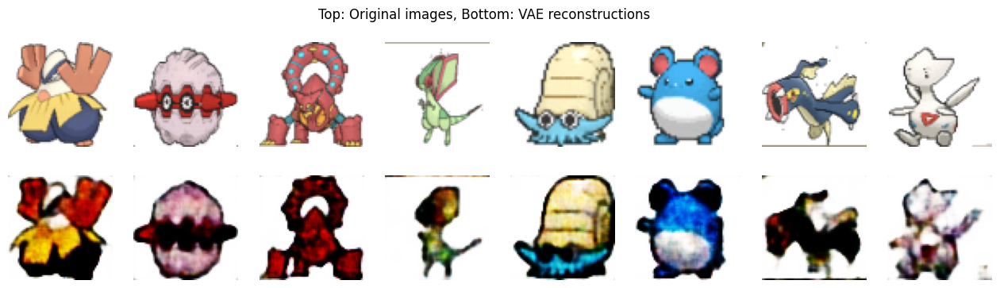

Epoch 27, Loss: 896.9782


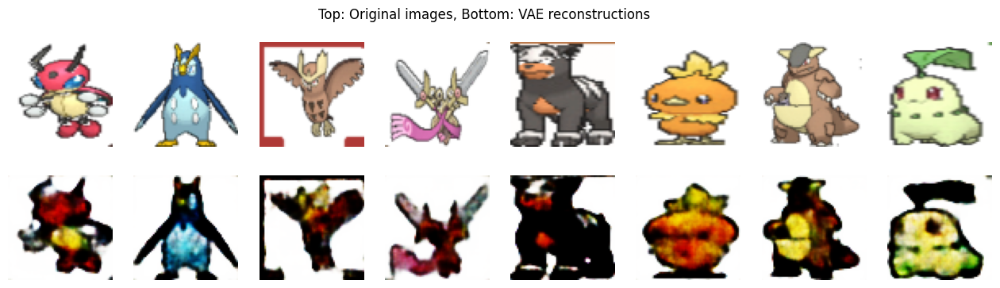

Epoch 28, Loss: 893.5874


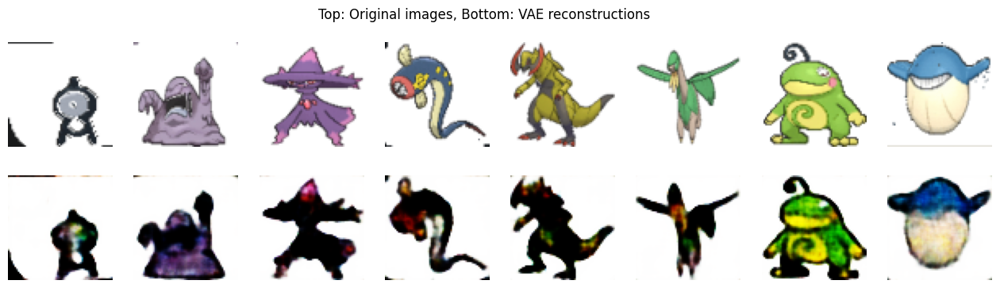

Epoch 29, Loss: 890.3813


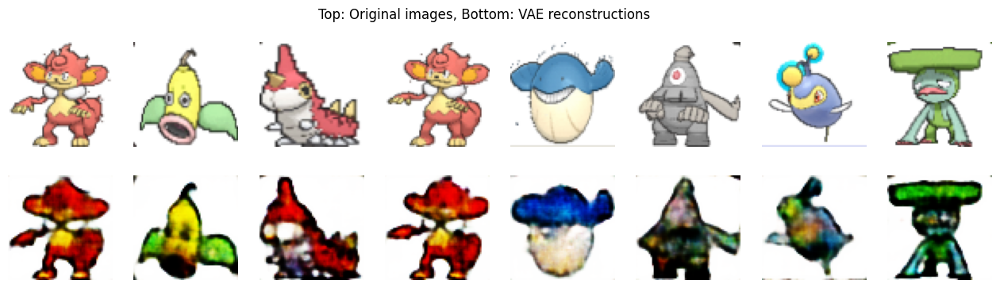

Epoch 30, Loss: 887.6324


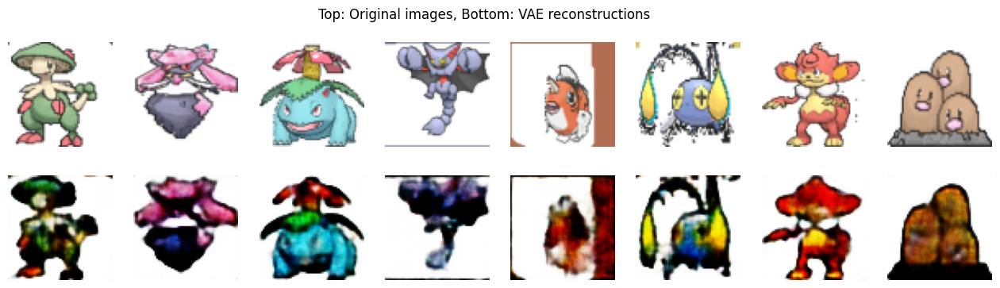

In [7]:
import torch.nn.functional as F

# Loss function for VAE
def vae_loss(recon_x, x, mu, logvar):
    # Reconstruction loss (MSE or BCE)
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    # KL divergence
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + kld

# Training loop
def train_vae(model, dataloader, num_epochs, lr, device):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    model.train()
    for epoch in range(num_epochs):
        total_loss = 0
        for X, _ in dataloader:
            X = X.to(device)
            optimizer.zero_grad()
            recon, mu, logvar = model(X)
            loss = vae_loss(recon, X, mu, logvar)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        avg_loss = total_loss / len(dataloader.dataset)
        print(f'Epoch {epoch+1}, Loss: {avg_loss:.4f}')

        # Visualize reconstructions
        with torch.no_grad():
            model.eval()
            sample = next(iter(dataloader))[0].to(device)[:8]  # Take first 8 images
            recon, _, _ = model(sample)
            recon = recon.cpu()
            sample = sample.cpu()

            fig, axes = plt.subplots(2, 8, figsize=(16,4))
            for i in range(8):
                axes[0, i].imshow(sample[i].permute(1, 2, 0) * 0.5 + 0.5)  # Unnormalize if normalized
                axes[0, i].axis('off')
                axes[1, i].imshow(recon[i].permute(1, 2, 0))
                axes[1, i].axis('off')
            plt.suptitle('Top: Original images, Bottom: VAE reconstructions')
            plt.show()

# Usage example, assuming you have pokemon DataLoader named 'dataiter' loaded in your notebook
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
latent_dim = 128
vae = ConvVAE(latent_dim=latent_dim)

num_epochs = 30
lr = 1e-3
train_vae(vae, data_iter, num_epochs=num_epochs, lr=lr, device=device)

### 1.3 Inference
Finally, let's do the inference on our exemples

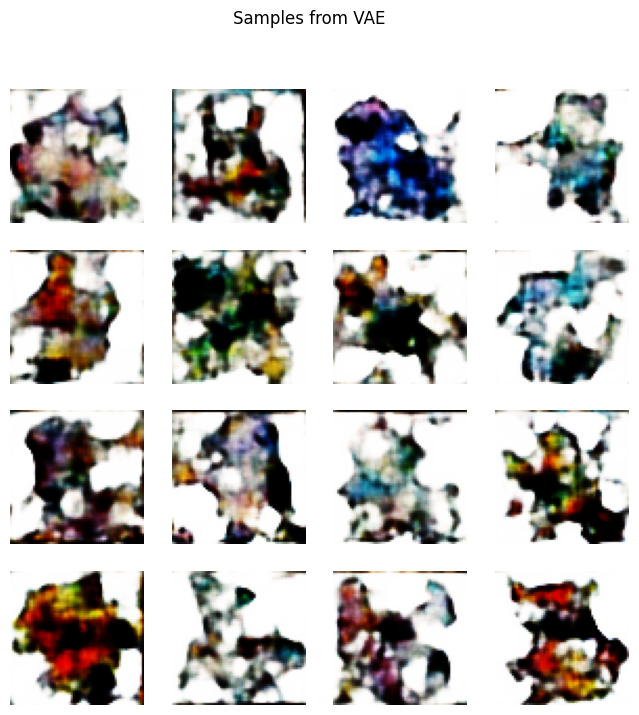

In [8]:
import matplotlib.pyplot as plt
import torch

def sample_vae(model, num_samples=16, latent_dim=128, device='cpu'):
    model.eval()
    with torch.no_grad():
        # Sample latent vectors from standard normal distribution
        z = torch.randn(num_samples, latent_dim, device=device)
        # Decode to image space
        samples = model.decode(z).cpu()

        # Plot samples in a grid
        grid_size = int(num_samples**0.5)
        fig, axes = plt.subplots(grid_size, grid_size, figsize=(grid_size*2, grid_size*2))
        for i, ax in enumerate(axes.flatten()):
            img = samples[i].permute(1, 2, 0)  # CHW to HWC
            ax.imshow(img)
            ax.axis('off')
        plt.suptitle('Samples from VAE')
        plt.show()

sample_vae(vae, num_samples=16, latent_dim=128, device=device)

## Part 2: GAN
### 2.1 GAN model - generator
Let's create a very simple generator, doing a series of 4 convolutions, and one transposed convolution.

In [9]:
class G_block(nn.Module):
    def __init__(self, out_channels, in_channels=3, kernel_size=4, strides=2,
                 padding=1, **kwargs):
        super(G_block, self).__init__(**kwargs)
        self.conv2d_trans = nn.ConvTranspose2d(in_channels, out_channels,
                                kernel_size, strides, padding, bias=False)
        self.batch_norm = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()

    def forward(self, X):
        return self.activation(self.batch_norm(self.conv2d_trans(X)))

n_G = 64
net_G = nn.Sequential(
    G_block(in_channels=100, out_channels=n_G*8,
            strides=1, padding=0),                  # Output: (64 * 8, 4, 4)
    G_block(in_channels=n_G*8, out_channels=n_G*4), # Output: (64 * 4, 8, 8)
    G_block(in_channels=n_G*4, out_channels=n_G*2), # Output: (64 * 2, 16, 16)
    G_block(in_channels=n_G*2, out_channels=n_G),   # Output: (64, 32, 32)
    nn.ConvTranspose2d(in_channels=n_G, out_channels=3,
                       kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh())

### 2.2 GAN model - discriminator
We can now define a discriminator as a mirror of the generator:

In [10]:
class D_block(nn.Module):
    def __init__(self, out_channels, in_channels=3, kernel_size=4, strides=2,
                padding=1, alpha=0.2, **kwargs):
        super(D_block, self).__init__(**kwargs)
        self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size,
                                strides, padding, bias=False)
        self.batch_norm = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(alpha, inplace=True)

    def forward(self, X):
        return self.activation(self.batch_norm(self.conv2d(X)))

n_D = 64
net_D = nn.Sequential(
    D_block(n_D),  # Output: (64, 32, 32)
    D_block(in_channels=n_D, out_channels=n_D*2),  # Output: (64 * 2, 16, 16)
    D_block(in_channels=n_D*2, out_channels=n_D*4),  # Output: (64 * 4, 8, 8)
    D_block(in_channels=n_D*4, out_channels=n_D*8),  # Output: (64 * 8, 4, 4)
    nn.Conv2d(in_channels=n_D*8, out_channels=1,
              kernel_size=4, bias=False))  # Output: (1, 1, 1)

### 2.3 Training loop
We can now train our model on the pokemon dataset

Finally, we can define the training loop. Here you will need to fill the parts maked as

```
## TO COMPLETE ##
```

In [11]:
def update_D(X, Z, net_D, net_G, loss_fn, trainer_D):
    # Forward real images
    batch_size = X.shape[0]
    real_labels = torch.ones((batch_size, 1, 1, 1), device=X.device)
    fake_labels = torch.zeros((batch_size, 1, 1, 1), device=X.device)

    trainer_D.zero_grad()

    # Real images
    outputs_real = net_D(X)
    loss_real = loss_fn(outputs_real, real_labels)
    loss_real.backward()

    # Fake images
    fake_images = net_G(Z)
    outputs_fake = net_D(fake_images.detach())
    loss_fake = loss_fn(outputs_fake, fake_labels)
    loss_fake.backward()

    trainer_D.step()

    return (loss_real + loss_fake).item()

def update_G(Z, net_D, net_G, loss_fn, trainer_G):
    batch_size = Z.shape[0]
    real_labels = torch.ones((batch_size, 1, 1, 1), device=Z.device)

    trainer_G.zero_grad()
    fake_images = net_G(Z)
    outputs = net_D(fake_images)
    loss_G = loss_fn(outputs, real_labels)
    loss_G.backward()
    trainer_G.step()
    return loss_G.item()

def train(net_D, net_G, data_iter, num_epochs, lr, latent_dim,
          device=try_gpu()):
    loss = nn.BCEWithLogitsLoss(reduction='sum')
    for w in net_D.parameters():
        nn.init.normal_(w, 0, 0.02)
    for w in net_G.parameters():
        nn.init.normal_(w, 0, 0.02)
    net_D, net_G = net_D.to(device), net_G.to(device)
    trainer_hp = {'lr': lr, 'betas': (0.5, 0.999)}
    trainer_D = torch.optim.Adam(net_D.parameters(), **trainer_hp)
    trainer_G = torch.optim.Adam(net_G.parameters(), **trainer_hp)


    timer = Timer()
    metric = Accumulator(3)  # loss_D, loss_G, num_examples

    epochs_list = []
    loss_D_list = []
    loss_G_list = []

    for epoch in range(1, num_epochs + 1):
        timer.start()
        metric.reset()
        for X, _ in data_iter:
            batch_size = X.shape[0]
            Z = torch.normal(0, 1, size=(batch_size, latent_dim, 1, 1), device=device)
            X = X.to(device)

            loss_D = update_D(X, Z, net_D, net_G, loss, trainer_D)
            loss_G = update_G(Z, net_D, net_G, loss, trainer_G)
            metric.add(loss_D, loss_G, batch_size)

        timer.stop()

        # Show generated examples in the second subplot
        Z = torch.normal(0, 1, size=(21, latent_dim, 1, 1), device=device)
        fake_x = net_G(Z).permute(0, 2, 3, 1) / 2 + 0.5
        imgs = torch.cat(
            [torch.cat([fake_x[i * 7 + j].cpu().detach() for j in range(7)], dim=1)
             for i in range(len(fake_x) // 7)], dim=0)
        imgs_np = imgs.numpy()

        loss_D, loss_G = metric[0] / metric[2], metric[1] / metric[2]
        epochs_list.append(epoch)
        loss_D_list.append(loss_D)
        loss_G_list.append(loss_G)

        fig, axs = plt.subplots(2, 1, figsize=(4, 5))
        # Plot losses
        axs[0].plot(epochs_list, loss_D_list, label='Discriminator Loss')
        axs[0].plot(epochs_list, loss_G_list, label='Generator Loss')
        axs[0].set_xlabel('Epoch')
        axs[0].set_ylabel('Loss')
        axs[0].legend()

        # Show generated images
        axs[1].imshow(imgs_np)
        axs[1].axis('off')
        axs[1].set_title('Generated Images')
        plt.show()


        print(f'#{epoch}: loss_D {loss_D:.3f}, loss_G {loss_G:.3f}')


    print(f'loss_D {loss_D:.3f}, loss_G {loss_G:.3f}, '
          f'{metric[2] / timer.total_time:.1f} examples/sec on {str(device)}')


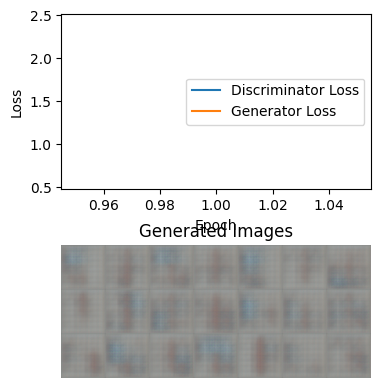

#1: loss_D 0.567, loss_G 2.422


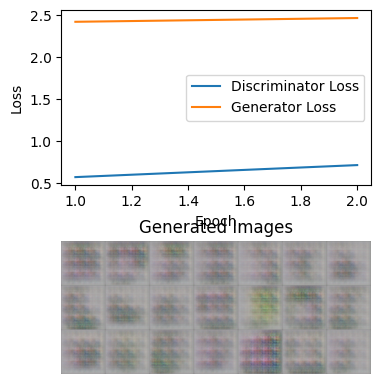

#2: loss_D 0.711, loss_G 2.467


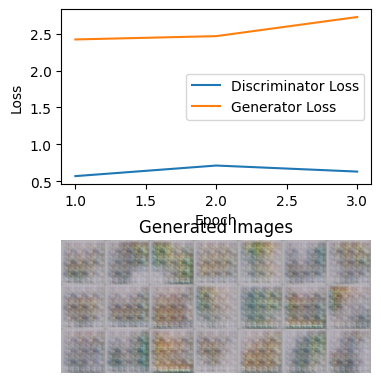

#3: loss_D 0.629, loss_G 2.726


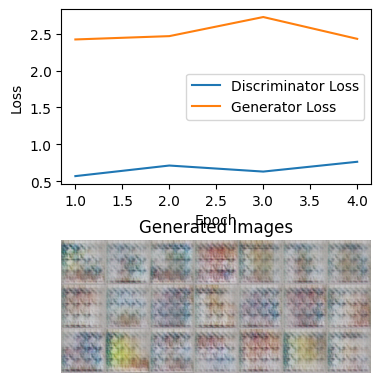

#4: loss_D 0.762, loss_G 2.430


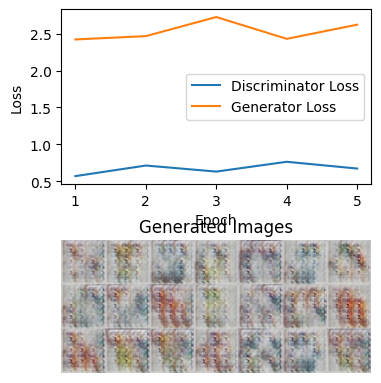

#5: loss_D 0.670, loss_G 2.622


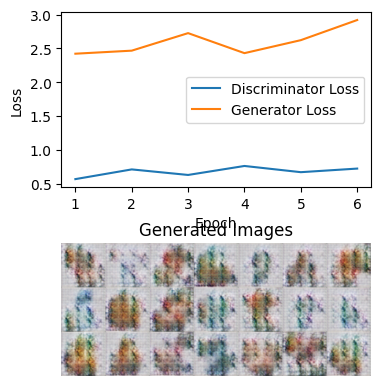

#6: loss_D 0.723, loss_G 2.919


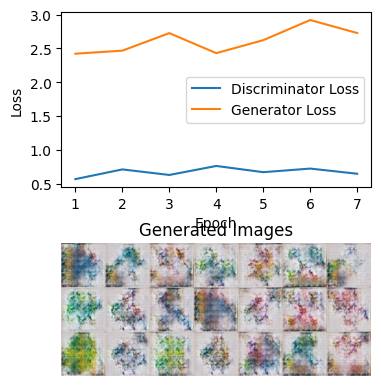

#7: loss_D 0.647, loss_G 2.727


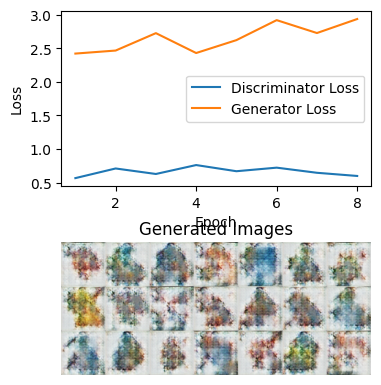

#8: loss_D 0.599, loss_G 2.936


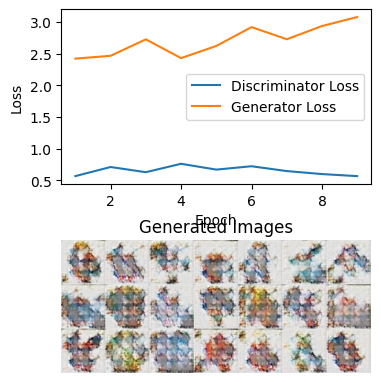

#9: loss_D 0.567, loss_G 3.078


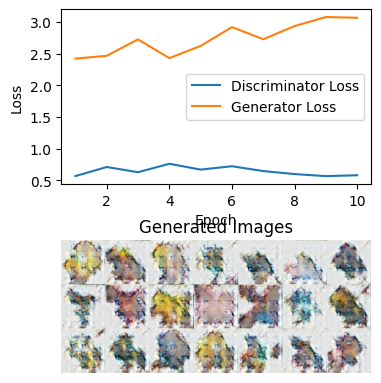

#10: loss_D 0.581, loss_G 3.067


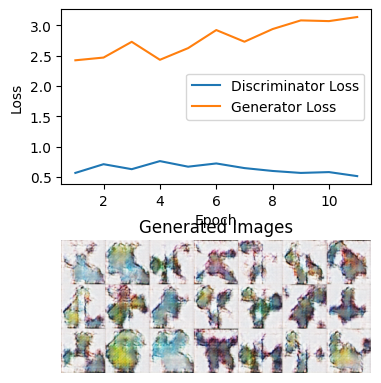

#11: loss_D 0.515, loss_G 3.134


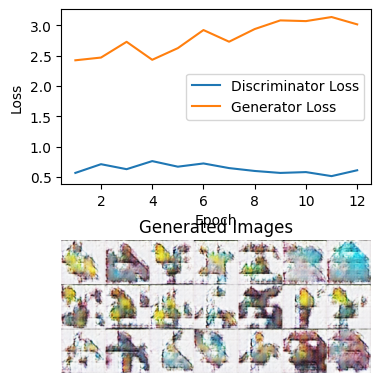

#12: loss_D 0.611, loss_G 3.013


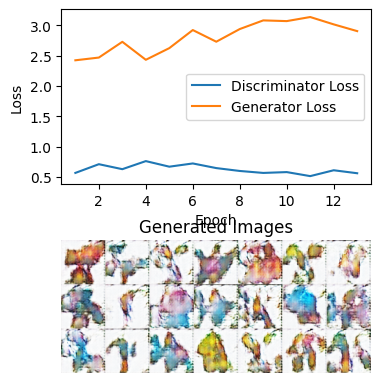

#13: loss_D 0.562, loss_G 2.902


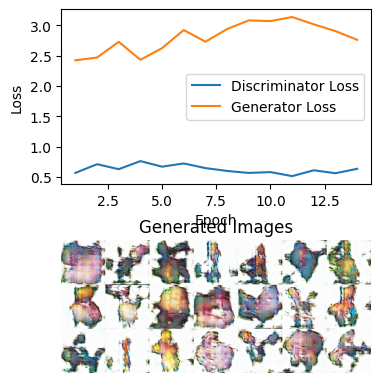

#14: loss_D 0.635, loss_G 2.758


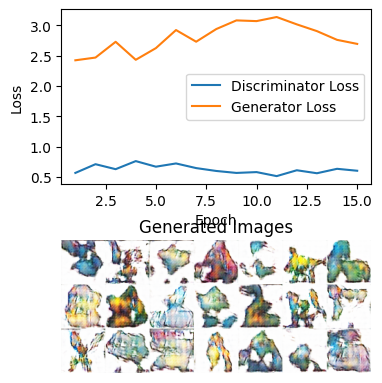

#15: loss_D 0.603, loss_G 2.692


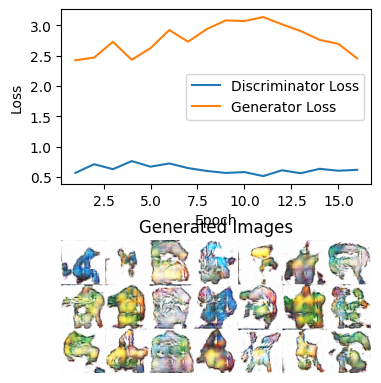

#16: loss_D 0.618, loss_G 2.452


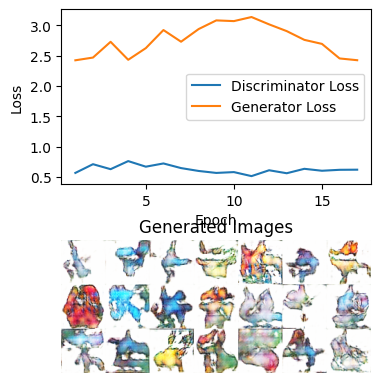

#17: loss_D 0.621, loss_G 2.423


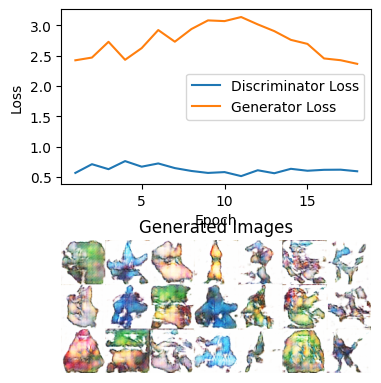

#18: loss_D 0.594, loss_G 2.363


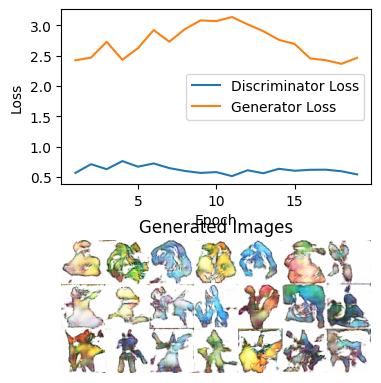

#19: loss_D 0.543, loss_G 2.463


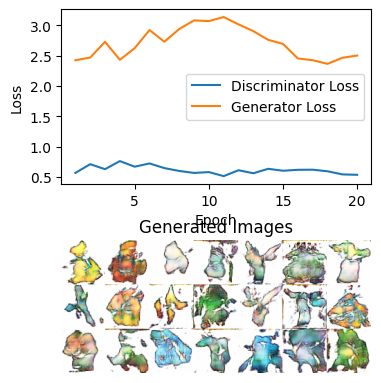

#20: loss_D 0.536, loss_G 2.500
loss_D 0.536, loss_G 2.500, 36.9 examples/sec on cuda


In [12]:
latent_dim = 100
lr = 0.0002
num_epochs = 20
train(net_D, net_G, data_iter, num_epochs, lr, latent_dim)